# **Lab 2.1 Image Enhancement with Math Operation**
This lab consists of two main subparts: Image Pixel Adjustment using Linear Equations and Gamma Equations.

In [4]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.axes_grid1 import ImageGrid
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import math

Read an image using OpenCV (Use your own image).

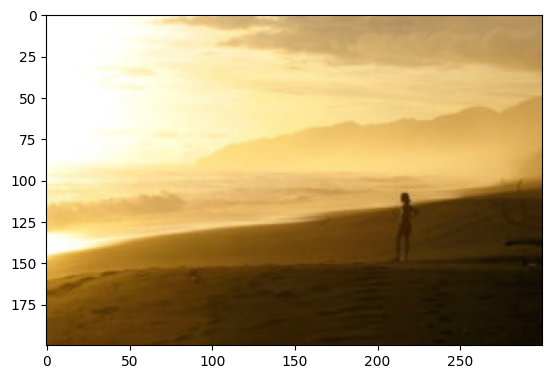

In [5]:
### START CODE HERE ###
img_p = cv2.imread("image/images1.jpg")
img = cv2.cvtColor(img_p, cv2.COLOR_BGR2RGB)
plt.imshow(img)
### END CODE HERE ###

## **Image Pixel Adjustment**

### Using Linear Equation
$$I_{new} = I \cdot a + b$$

Please perform at ***least 20 iterations*** with varying values of $a$ and $b$.
Assign the result of each iteration to an array.<br/>

In [6]:
### START CODE HERE ###
a = 0
b = 0
lin_result = []

gen_number=np.linspace(0,5,40)
for i in gen_number:
    a = i
    b = i
    img_new = (img*a)+b
    if np.any(img_new > 255):
        img_new[img_new>255] = 255
    lin_result.append(img_new.astype(np.uint8))


### END CODE HERE ###

Plot the images in a grid as shown below. Using `ImageGrid`.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical
- The reference output used 40 iterations.

![image-2.png](https://github.com/Digital-Image-Processing-Laboratory/image_processing-2024/blob/master/Lab2_Image-Enhancement/assets/1-1.png?raw=true)
</details>


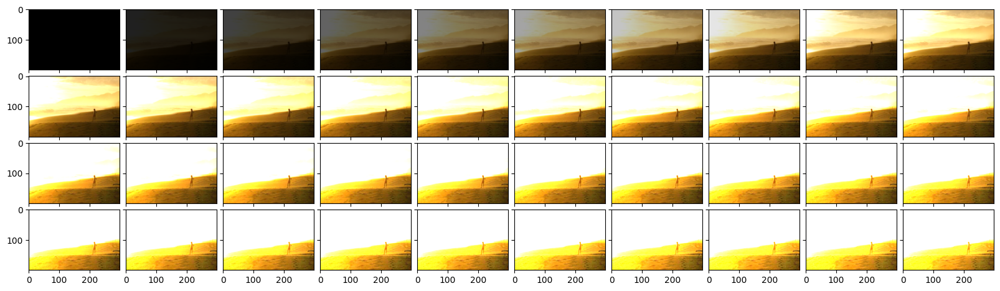

In [7]:
### START CODE HERE ###
fig = plt.figure(figsize=(20., 20.))
grid = ImageGrid(fig, 111, nrows_ncols=(4,10), axes_pad=0.1)

for ax, im in zip(grid, lin_result):
    # Iterating over the grid returns the Axes.
    ax.imshow(im)


plt.show()
### END CODE HERE ###

If you code work properly, the cell below should run without error.

In [8]:
assert len(lin_result) >= 20, f"Expected more than or equal 20 iterations but got {len(lin_result)}"
for idx, result in enumerate(lin_result):
    assert result.shape == img.shape, f"Shape mismatch at index {idx}. Expected {img.shape} but got {result.shape}"
    assert result.dtype == np.uint8, f"Data type mismatch at index {idx}. Expected uint8 but got {result.dtype}"
    assert np.all((result >= 0) & (result <= 255)), f"Pixel value out of bounds at index {idx}"

Save the array of images to a video. Please complete the function below.

In [9]:
### START CODE HERE ###
def write_images_to_video(image_array, output_file, frame_rate=30):
    height = image_array[0].shape[0]
    width = image_array[0].shape[1]
    print(height)
    print(width)
    fourcc = cv2.VideoWriter_fourcc(*'MP4V')
    out = cv2.VideoWriter(output_file, fourcc, frame_rate, (width, height))
    #เข้าถึงแต่ละ Frame ภาพ จาก Video Array
    for frame in image_array:
        out.write(cv2.cvtColor(frame, cv2.COLOR_RGB2BGR))
    out.release()
### END CODE HERE ###

Use `write_images_to_video()` and save the result.

In [10]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file =  os.path.join(output_folder, "output_linear.mp4")
write_images_to_video(lin_result,output_file)

200
300


Now use `matplotlib.animation` to display the animation from the images array.

In [11]:
%%capture
### START CODE HERE ###
fig, ax = plt.subplots()
ims = []

for frame in lin_result:
    im = ax.imshow(frame)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims)
plt.show()
### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![linear.gif](![<attachment:linear (2).gif>](https://github.com/Digital-Image-Processing-Laboratory/image_processing-2024/blob/master/Lab2_Image-Enhancement/assets/linear.gif?raw=true))

</details>

In [12]:
display(HTML(ani.to_jshtml()))

### Gamma Equation
$$I_{new} = I^{\gamma} \cdot a + b$$

Where $a$ is 1 and $b$ is 0. 
Please perform ***at least 20 iterations*** for 0 < $\gamma$ < 2 and another ***at least 20 iterations*** for $\gamma$ > 1
Assign the result of each iteration to an array.<br/>


In [13]:
### START CODE HERE ###
a = 1
b = 0
gamma = 0.1
# 0 -1 : 20 iteration
# > 1 : 20 iteation
gam_result = []
gamma=np.linspace(0,2,20)
img_norm = (img - 0)/(255 - 0)
for i in gamma:
    img_new = (((img_norm**i))*a)+b
    img_new *= 255
    if np.any(img_new > 255):
        img_new[img_new >255] = 255
    gam_result.append(img_new.astype(np.uint8))
        


### END CODE HERE ###

Plot the images in a grid as shown below. Using `ImageGrid`.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image-2.png](https://github.com/Digital-Image-Processing-Laboratory/image_processing-2024/blob/master/Lab2_Image-Enhancement/assets/1-2.png?raw=true)
</details>

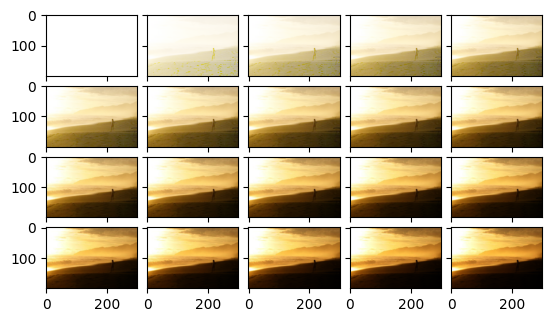

In [14]:
### START CODE HERE ###


fig = plt.figure()
grid = ImageGrid(fig, 111, nrows_ncols=(4,5), axes_pad=0.1)

for ax, im in zip(grid, gam_result):
    # Iterating over the grid returns the Axes.
    ax.imshow(im)


plt.show()
### END CODE HERE ###

In [15]:
assert len(gam_result) == 20, f"Expected {20} iterations but got {len(gam_result)}"
for idx, result in enumerate(gam_result):
    assert result.shape == img.shape, f"Shape mismatch at index {idx}. Expected {img.shape} but got {result.shape}"
    assert result.dtype == np.uint8, f"Data type mismatch at index {idx}. Expected uint8 but got {result.dtype}"
    assert np.all((result >= 0) & (result <= 255)), f"Pixel value out of bounds at index {idx}"

Use `write_images_to_video()` and save the result.

In [16]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file =  os.path.join(output_folder, "output_gamma.mp4")
write_images_to_video(gam_result,output_file)

200
300


Now use `matplotlib.animation` to display the animation from the images array.

In [17]:
%%capture
### START CODE HERE ###
fig, ax = plt.subplots()
ims = []

for frame in gam_result:
    im = ax.imshow(frame)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims)
plt.show()
### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![gamma2.gif](https://github.com/Digital-Image-Processing-Laboratory/image_processing-2024/blob/master/Lab2_Image-Enhancement/assets/gamma.gif?raw=true)

</details>

In [18]:
display(HTML(ani.to_jshtml()))

---

## **Questions**
1. If an image having over brightness or saturation, what would be possible solutions to enhance the image.
2. How can we make an image reverse intensity (black-to-white, white-to-black)? Explain the process

In [ ]:
#1. If an image having over brightness or saturation, what would be possible solutions to enhance the image.
#ANS:
#ใช้ Histogram Equalization โดยกระจายเฉดสีให้เท่าๆกัน

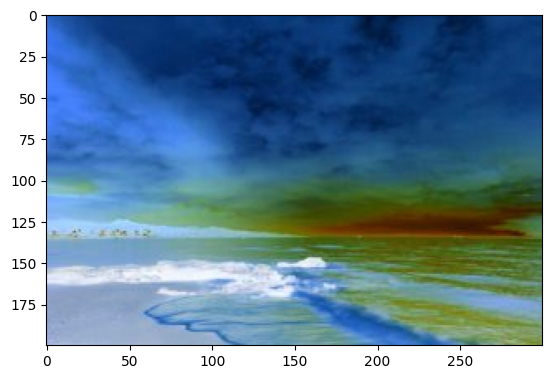

In [43]:
#2. How can we make an image reverse intensity (black-to-white, white-to-black)? Explain the process
#ANS:
img = cv2.imread("image/images2.jpg")
img = cv2.cvtColor(img_p, cv2.COLOR_BGR2RGB)
test = cv2.bitwise_not(img_p)
plt.imshow(test)

#ใช้ NOT เข้าช่วย
#the bitwise NOT function flips pixel values. All pixels that are greater than zero are set to zero, and all pixels that are equal to zero are set to 255:
# อ้างอิง https://pyimagesearch.com/2021/01/19/opencv-bitwise-and-or-xor-and-not/